In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv('Rainfall.csv')

In [3]:
data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


# Exploratory Data Analysis (EDA)

In [6]:
data.shape

(8425, 23)

In [7]:
data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [8]:
data.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

So we have 16 Numeric datatypes and 7 Object type data types.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [9]:
data.isna().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

From this we can notice that almost all fields have null values, So we have to use imputation technigues for removing the null values.

In [10]:
data.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

In [10]:
data=data.drop_duplicates()

In [11]:
data.shape

(8425, 23)

As we noticed earlier we had around 8425 records were present, but now only 6762 that means 1663 duplicate record were present in our data, so we have removed them.

In [12]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,8350.0,13.193305,5.403596,-2.0,9.20,13.3,17.4,28.5
MaxTemp,8365.0,23.859976,6.136408,8.2,19.30,23.3,28.0,45.5
Rainfall,8185.0,2.805913,10.459379,0.0,0.00,0.0,1.0,371.0
Evaporation,4913.0,5.389395,5.044484,0.0,2.60,4.6,7.0,145.0
Sunshine,4431.0,7.632205,3.896235,0.0,4.75,8.7,10.7,13.9
WindGustSpeed,7434.0,40.174469,14.665721,7.0,30.00,39.0,50.0,107.0
WindSpeed9am,8349.0,13.847646,10.174579,0.0,6.00,13.0,20.0,63.0
WindSpeed3pm,8318.0,18.533662,9.766986,0.0,11.00,19.0,24.0,83.0
Humidity9am,8366.0,67.822496,16.833283,10.0,56.00,68.0,80.0,100.0
Humidity3pm,8323.0,51.249790,18.423774,6.0,39.00,51.0,63.0,99.0


This is the statistical description of our data:

> As we noticed many feature contains null values the count is different for all.

> Many feature the minimum values is 0.

> Some features contains negative values also.

# Data Preprocessing

In [13]:
for i in data.columns:
        print(data[i].value_counts())
        print('*'*100)

Date
2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: count, Length: 3004, dtype: int64
****************************************************************************************************
Location
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: count, dtype: int64
****************************************************************************************************
MinTemp
 12.0    74
 13.2    71
 13.8    69
 12.7    68
 16.4    67
         ..
 0.3      1
 28.3     1
-1.1      1
-1.4      1
 26.0     1
Name: count, Length: 285, dtype: int64
****************************************************************************************************
MaxTemp
19

From Above we can notice that there is no spacial character or space in between features, Also we noticed same number of values in RainToday and RainTomorrow, Let us check if they are same, if same we can remove one columns

In [14]:
if data['RainToday'].equals(data['RainTomorrow']):
    print ('Same Data')
else:
    print("Different Data")

Different Data


In [15]:
data['Date']=pd.to_datetime(data['Date'])
data["Day"] = data['Date'].dt.day
data["Month"] = data['Date'].dt.month
data["Year"] = data['Date'].dt.year

In [16]:
data.drop("Date",axis=1,inplace=True)

In [17]:
#As we removed around 1663 records let us check again null value sum
data.isnull().sum()

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Day                 0
Month               0
Year                0
dtype: int64

The number is now reduced from the past.

In [18]:
categorical_col=[]
for i in data.dtypes.index:
    if data.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns are:\n",categorical_col)
print("\n")

# Now checking for numerical columns
numerical_col=[]
for i in data.dtypes.index:
    if data.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)

Categorical columns are:
 ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical columns are:
 ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']


In [20]:
df=pd.DataFrame()
df['WindGustDir'] = data['WindGustDir'].fillna(data['WindGustDir'].mode()[0])
df['WindDir9am'] = data['WindDir9am'].fillna(data['WindDir9am'].mode()[0])
df['WindDir3pm'] = data['WindDir3pm'].fillna(data['WindDir3pm'].mode()[0])
df['RainToday'] = data['RainToday'].fillna(data['RainToday'].mode()[0])
df['RainTomorrow']=data['RainTomorrow'].fillna(data['RainTomorrow'].mode()[0])
df['Location']=data['Location']

In [21]:
df

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location
0,W,W,WNW,No,No,Albury
1,WNW,NNW,WSW,No,No,Albury
2,WSW,W,WSW,No,No,Albury
3,NE,SE,E,No,No,Albury
4,W,ENE,NW,No,No,Albury
...,...,...,...,...,...,...
8420,E,SE,ENE,No,No,Uluru
8421,NNW,SE,N,No,No,Uluru
8422,N,SE,WNW,No,No,Uluru
8423,SE,SSE,N,No,No,Uluru


In [22]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [23]:
itimp=IterativeImputer()
befor_imp=pd.DataFrame(data[numerical_col])

In [24]:
kk_df=pd.DataFrame(itimp.fit_transform(befor_imp),columns=numerical_col)
kk_df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,13.4,22.900000,0.6,3.194193,7.017613,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,5.123513,16.9,21.8,1.0,12.0,2008.0
1,7.4,25.100000,0.0,3.782574,12.799771,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,1.099226,1.619932,17.2,24.3,2.0,12.0,2008.0
2,12.9,25.700000,0.0,5.728303,12.205468,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,2.220047,2.000000,21.0,23.2,3.0,12.0,2008.0
3,9.2,28.000000,0.0,3.558423,13.319713,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,0.506143,1.025754,18.1,26.5,4.0,12.0,2008.0
4,17.5,32.300000,1.0,3.765248,6.979772,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,5.0,12.0,2008.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,0.0,6.957544,11.418350,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,0.853871,1.727655,10.1,22.4,21.0,6.0,2017.0
8421,3.6,25.300000,0.0,6.663456,12.104654,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,0.729596,1.292887,10.9,24.5,22.0,6.0,2017.0
8422,5.4,26.900000,0.0,8.423890,11.881216,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,1.003774,1.735513,12.5,26.1,23.0,6.0,2017.0
8423,7.8,27.000000,0.0,8.745717,10.868035,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,24.0,6.0,2017.0


In [25]:
df[numerical_col]=kk_df[numerical_col]

In [27]:
df.shape

(6762, 25)

In [26]:
df.isna().sum()

WindGustDir      0
WindDir9am       0
WindDir3pm       0
RainToday        0
RainTomorrow     0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
Day              0
Month            0
Year             0
dtype: int64

In [29]:
df.dropna(inplace=True)
df.shape

(5099, 25)

<Axes: >

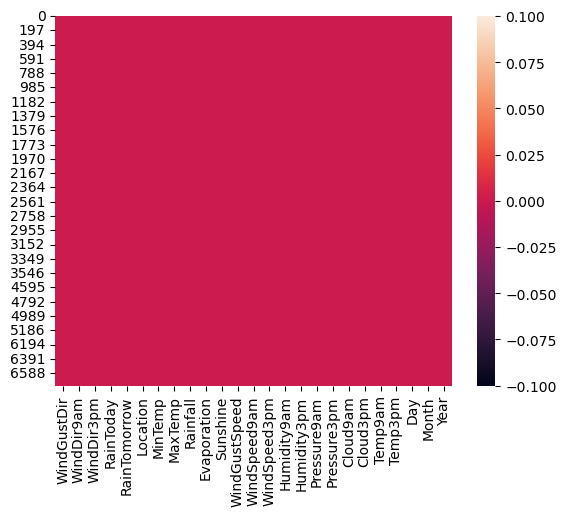

In [30]:
# Visaulize the same
sns.heatmap(df.isna())

So from this we can identify that all null values have been removed.

# Visualization

In [27]:
categorical_col

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [28]:
print(df['WindGustDir'].value_counts())
sns.countplot(df['WindGustDir'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

WindGustDir
N      1704
SSE     578
S       577
SW      572
E       557
WNW     531
W       507
WSW     504
SE      484
ENE     415
SSW     396
NW      383
NE      353
NNE     343
ESE     302
NNW     219
Name: count, dtype: int64


ValueError: Cannot use `hue` without `x` and `y`

In [34]:
numerical_col 

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Day',
 'Month',
 'Year']

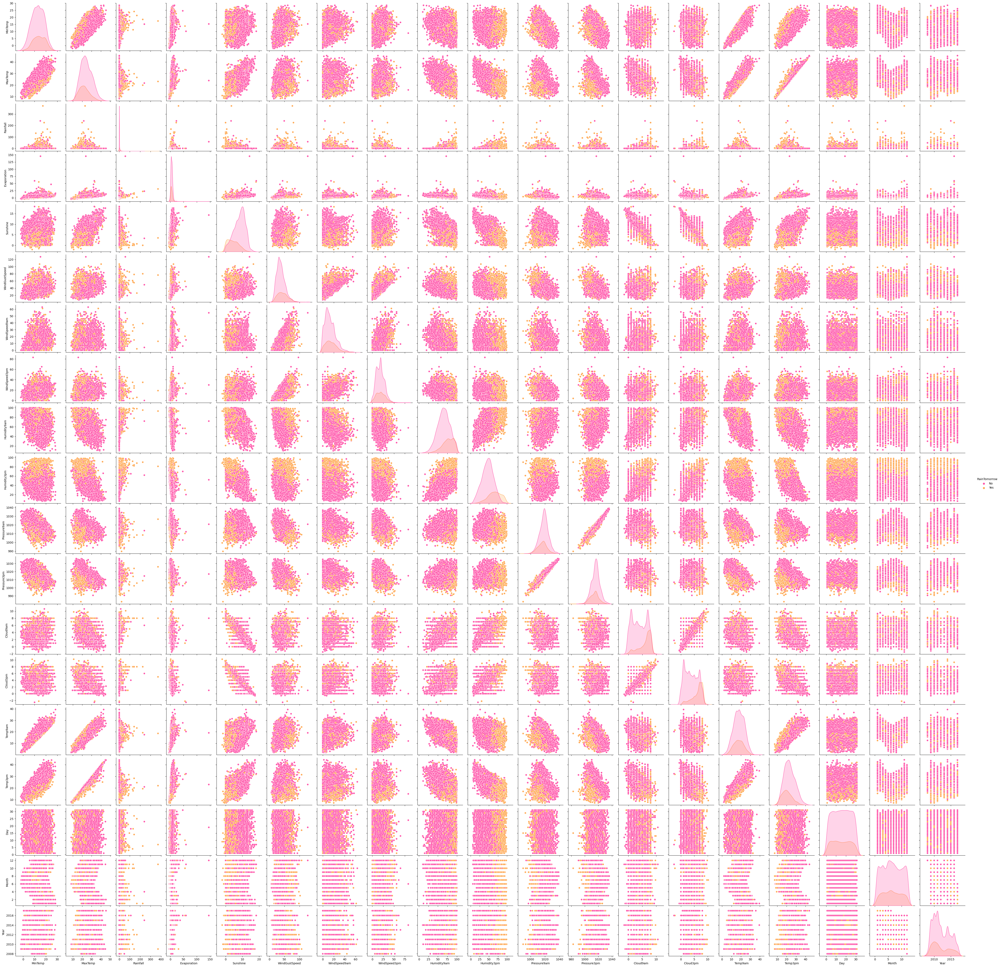

In [29]:
sns.pairplot(df,palette='spring',hue='RainTomorrow')
plt.show()

# Identifying the outliers

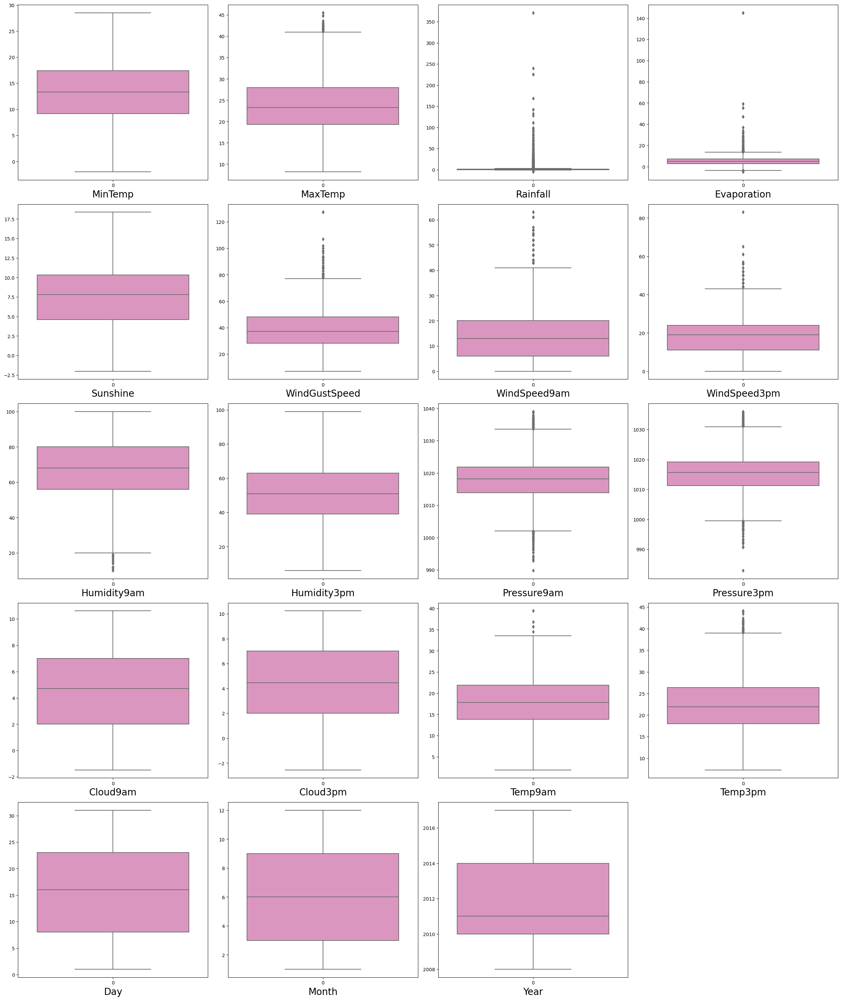

In [30]:
plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column],palette="Set2_r")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

Most of the features contains outliers, let us remove the out liners using ZScore method

In [31]:
features=df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,0.156456,0.217597,0.470174,0.103076,0.318906,0.604181,0.565066,0.188036,1.597292,1.320647,0.154251,0.105721
1,0.202783,0.275666,0.337274,1.450594,0.318906,0.969446,0.359334,1.419973,1.141536,1.209283,0.100831,0.313617
2,0.300757,0.275666,0.102215,1.290905,0.453934,0.505829,0.770798,1.777309,1.613008,1.066100,0.575834,0.129108
3,0.676325,0.275666,0.387904,1.590304,1.031369,0.280984,0.977922,1.360417,0.041437,0.413823,0.059432,0.682634
4,1.378474,0.178884,0.341188,0.113244,0.116365,0.674391,0.153603,0.843151,1.110105,1.495648,0.006011,1.219387
...,...,...,...,...,...,...,...,...,...,...,...,...
8420,0.074811,0.275666,0.379869,1.079406,0.558772,0.084281,0.772190,1.003082,1.058663,0.779367,1.365124,0.005080
8421,0.235441,0.275666,0.313442,1.263816,1.166396,0.084281,0.977922,0.705302,0.885790,0.588457,1.222669,0.347164
8422,0.496705,0.275666,0.711078,1.203778,0.153690,0.477687,0.977922,0.883970,0.492897,0.222545,0.937757,0.615540
8423,0.513034,0.275666,0.783770,0.931535,0.761314,0.084281,1.183654,1.003082,0.241446,0.174818,0.474777,0.598767


In [32]:
new_df = df[(z<3).all(axis=1)] 
new_df

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Rainfall,Evaporation,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,W,W,WNW,No,No,Albury,13.4,22.900000,0.6,3.194193,...,22.0,1007.7,1007.1,8.000000,5.123513,16.9,21.8,1.0,12.0,2008.0
1,WNW,NNW,WSW,No,No,Albury,7.4,25.100000,0.0,3.782574,...,25.0,1010.6,1007.8,1.099226,1.619932,17.2,24.3,2.0,12.0,2008.0
2,WSW,W,WSW,No,No,Albury,12.9,25.700000,0.0,5.728303,...,30.0,1007.6,1008.7,2.220047,2.000000,21.0,23.2,3.0,12.0,2008.0
3,NE,SE,E,No,No,Albury,9.2,28.000000,0.0,3.558423,...,16.0,1017.6,1012.8,0.506143,1.025754,18.1,26.5,4.0,12.0,2008.0
4,W,ENE,NW,No,No,Albury,17.5,32.300000,1.0,3.765248,...,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,5.0,12.0,2008.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,E,SE,ENE,No,No,Uluru,2.8,23.400000,0.0,6.957544,...,24.0,1024.6,1020.3,0.853871,1.727655,10.1,22.4,21.0,6.0,2017.0
8421,NNW,SE,N,No,No,Uluru,3.6,25.300000,0.0,6.663456,...,21.0,1023.5,1019.1,0.729596,1.292887,10.9,24.5,22.0,6.0,2017.0
8422,N,SE,WNW,No,No,Uluru,5.4,26.900000,0.0,8.423890,...,24.0,1021.0,1016.8,1.003774,1.735513,12.5,26.1,23.0,6.0,2017.0
8423,SE,SSE,N,No,No,Uluru,7.8,27.000000,0.0,8.745717,...,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,24.0,6.0,2017.0


In [33]:
# Total Data Loss 
dataloss=(5099-4839)/5099
dataloss*100

5.099039027260247

Only 5% data is loss.

# Finding Skewness

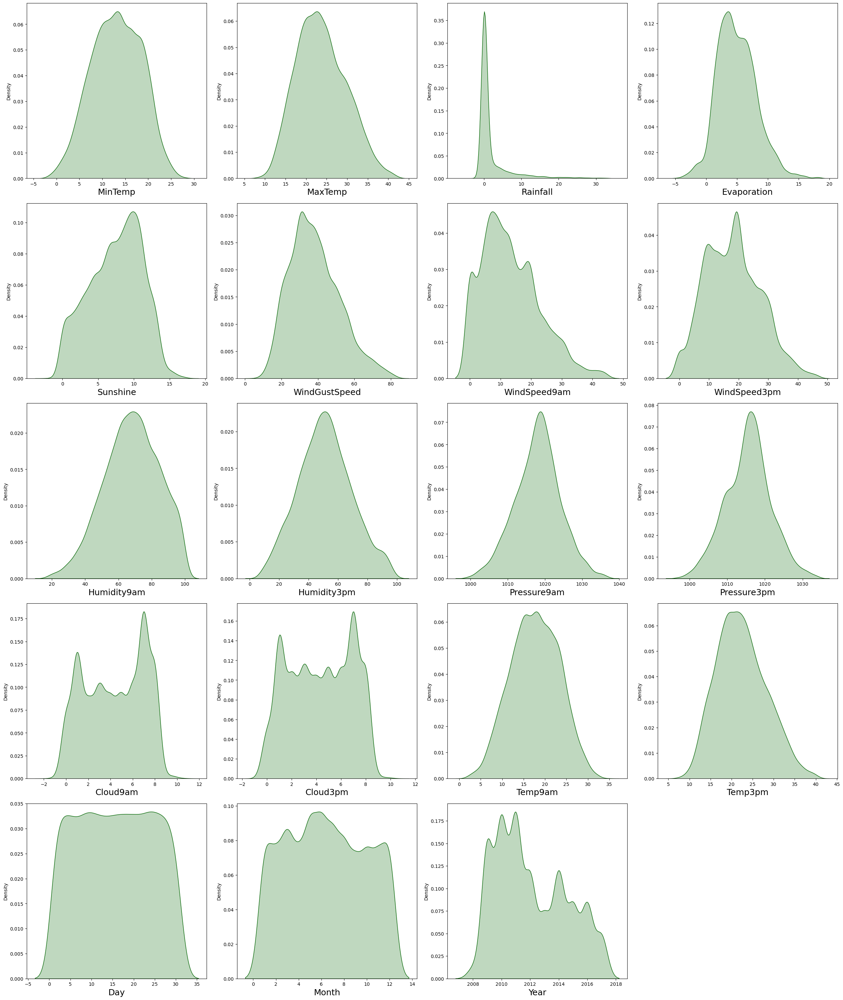

In [34]:
plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(new_df[column],color="darkgreen",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()

Few features like rainfall contains high skewness. Let us check using skew().

In [35]:
new_df.skew

<bound method NDFrame._add_numeric_operations.<locals>.skew of      WindGustDir WindDir9am WindDir3pm RainToday RainTomorrow Location  \
0              W          W        WNW        No           No   Albury   
1            WNW        NNW        WSW        No           No   Albury   
2            WSW          W        WSW        No           No   Albury   
3             NE         SE          E        No           No   Albury   
4              W        ENE         NW        No           No   Albury   
...          ...        ...        ...       ...          ...      ...   
8420           E         SE        ENE        No           No    Uluru   
8421         NNW         SE          N        No           No    Uluru   
8422           N         SE        WNW        No           No    Uluru   
8423          SE        SSE          N        No           No    Uluru   
8424           N        ESE        ESE        No           No    Uluru   

      MinTemp    MaxTemp  Rainfall  Evaporation 

# Removing Skewness using yeo-johnson method

In [36]:
skew=['Rainfall','Evaporation','WindGustSpeed','WindSpeed9am','WindSpeed3pm']
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

new_df[skew] = scaler.fit_transform(new_df[skew].values)
new_df[skew].head()

,Rainfall,Evaporation,WindGustSpeed,WindSpeed9am,WindSpeed3pm
0,0.043181,-0.523537,0.509993,0.784988,0.672990
1,-0.499617,-0.331041,0.509993,-0.980001,0.476108
2,-0.499617,0.282522,0.640863,0.701176,0.865458
3,-0.499617,-0.403928,-1.080034,-0.060807,-0.960887
4,0.284635,-0.336656,0.306324,-0.538078,0.274312


In [37]:
new_df[skew].skew()

Rainfall        -4.814637
Evaporation      0.109380
WindGustSpeed   -0.014370
WindSpeed9am    -0.112225
WindSpeed3pm    -0.075656
dtype: float64

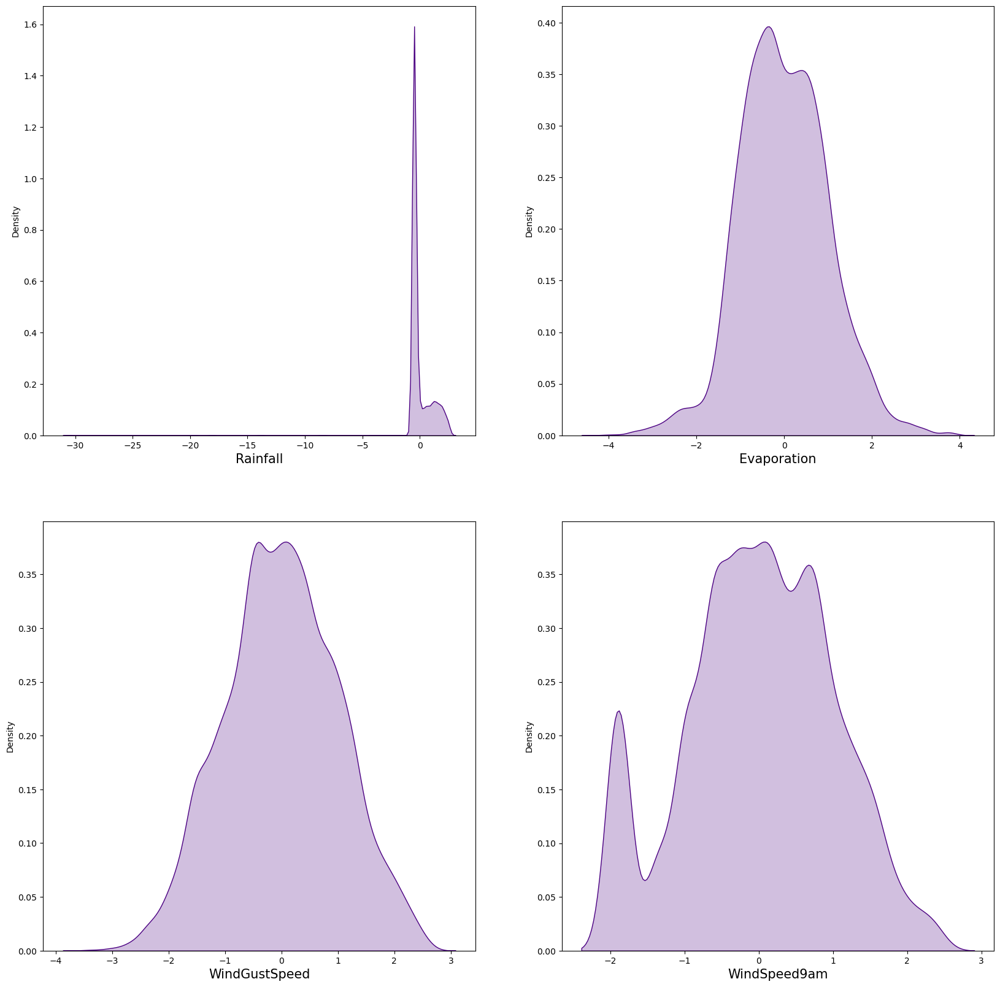

In [38]:
plt.figure(figsize=(20,20), facecolor='white')
plotnumber = 1

for column in new_df[skew]:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(new_df[column],color='indigo',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

In [39]:
# Removing skewness using square root method
new_df["Rainfall"] = np.cbrt(new_df["Rainfall"])

# Encoding the categorical columns using Label Encoding

In [40]:
from sklearn.preprocessing import LabelEncoder

LE=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(LE.fit_transform)

In [41]:
cor = new_df.corr()
cor

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Rainfall,Evaporation,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
WindGustDir,1.000000,0.406262,0.507123,0.119461,0.044176,-0.036768,-0.151348,-0.233463,0.135191,-0.120018,...,0.050649,-0.119644,-0.027718,0.117001,0.092689,-0.181747,-0.243794,0.016755,0.037731,-0.092814
WindDir9am,0.406262,1.000000,0.244078,0.147831,0.027908,-0.041017,-0.044212,-0.215452,0.151108,-0.023435,...,0.117682,-0.027489,0.066124,0.110129,0.083591,-0.100421,-0.223510,-0.011084,0.019236,-0.033080
WindDir3pm,0.507123,0.244078,1.000000,0.099789,0.004764,-0.031693,-0.152767,-0.190157,0.113856,-0.065883,...,-0.008659,-0.130693,-0.035574,0.076059,0.058185,-0.170249,-0.201395,-0.000431,0.027506,-0.010554
RainToday,0.119461,0.147831,0.099789,1.000000,0.294323,0.003251,0.061297,-0.219058,0.890797,-0.123324,...,0.346124,-0.107002,-0.030221,0.315201,0.279511,-0.093603,-0.227986,-0.016790,0.004496,-0.009500
RainTomorrow,0.044176,0.027908,0.004764,0.294323,1.000000,0.009867,0.092463,-0.149637,0.315837,-0.072407,...,0.448631,-0.162036,-0.130513,0.319238,0.382753,-0.020171,-0.191392,-0.013447,0.000474,-0.003126
Location,-0.036768,-0.041017,-0.031693,0.003251,0.009867,1.000000,0.119199,0.066512,0.032259,0.296175,...,0.059920,-0.019273,-0.011002,0.079815,0.075969,0.120736,0.063055,-0.004904,-0.085782,0.481965
MinTemp,-0.151348,-0.044212,-0.152767,0.061297,0.092463,0.119199,1.000000,0.723912,0.085094,0.594351,...,0.091784,-0.479305,-0.472186,0.134894,0.072809,0.890464,0.692733,0.008108,-0.247897,0.042313
MaxTemp,-0.233463,-0.215452,-0.190157,-0.219058,-0.149637,0.066512,0.723912,1.000000,-0.226969,0.668959,...,-0.410399,-0.360556,-0.452414,-0.322853,-0.324978,0.869158,0.979500,0.014876,-0.165817,0.121939
Rainfall,0.135191,0.151108,0.113856,0.890797,0.315837,0.032259,0.085094,-0.226969,1.000000,-0.106982,...,0.380787,-0.138015,-0.050588,0.369103,0.317391,-0.090812,-0.237762,-0.020010,0.028586,0.016380
Evaporation,-0.120018,-0.023435,-0.065883,-0.123324,-0.072407,0.296175,0.594351,0.668959,-0.106982,1.000000,...,-0.296400,-0.324471,-0.336456,-0.142379,-0.206172,0.674519,0.644422,0.005390,-0.027672,0.381914


Here, this gives the correlation between the denpendent and independent variables. We can visualize this by plotting heat map.

<Axes: >

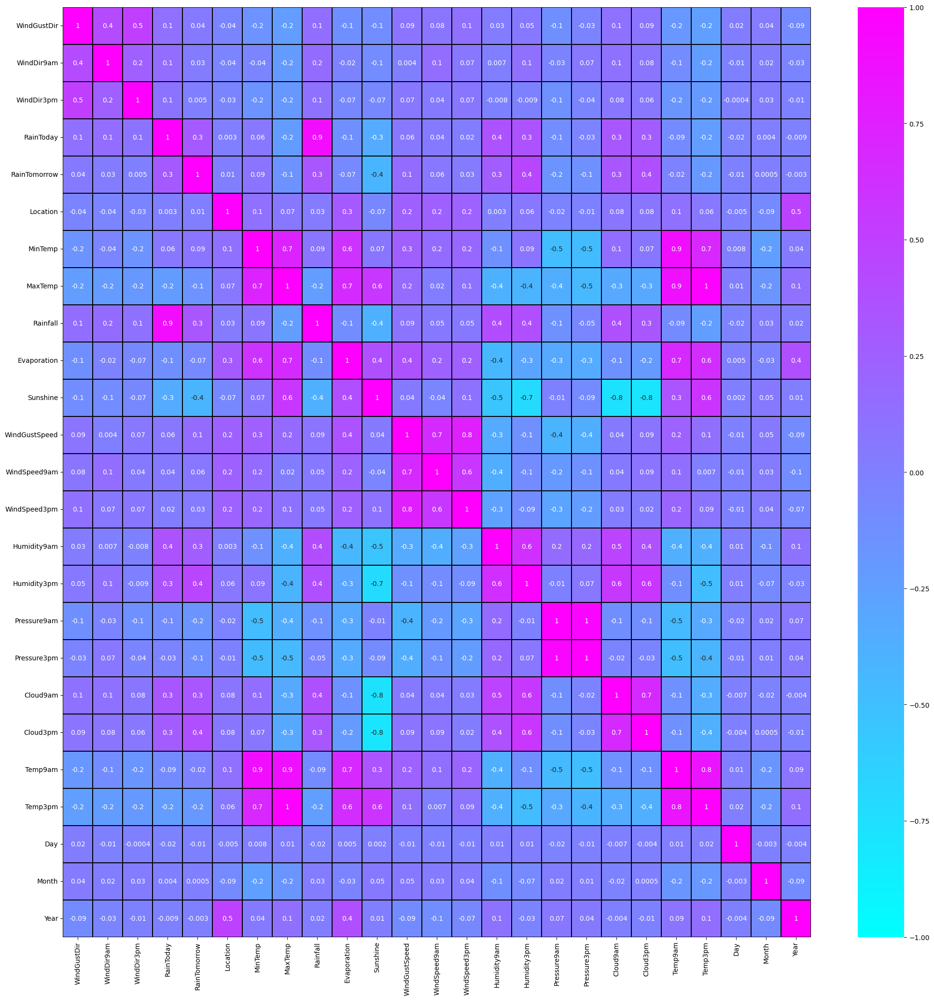

In [42]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(25,25))
sns.heatmap(new_df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="cool")

# Visualizing the correlation between label and features using bar plot 

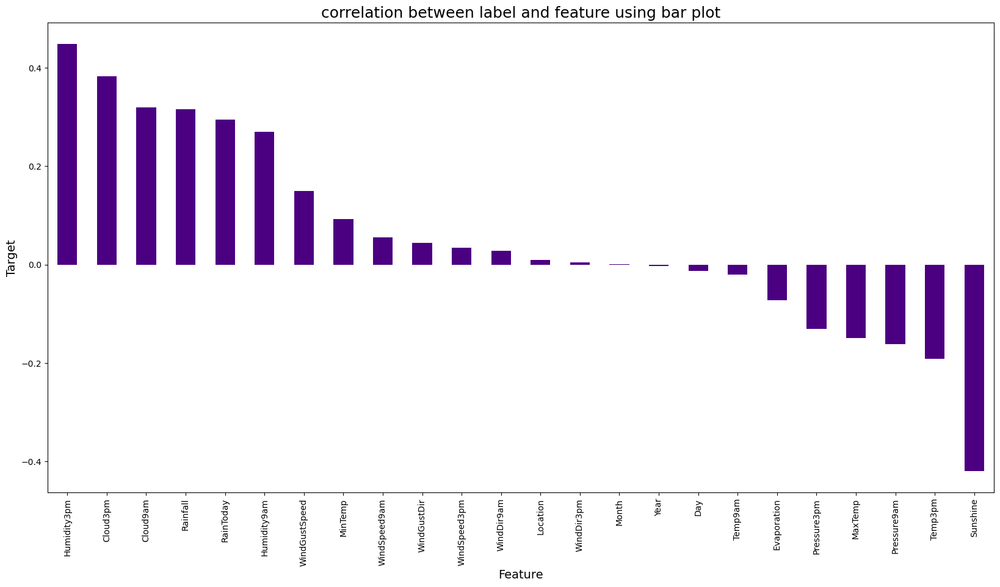

In [43]:
plt.figure(figsize=(20,10))
new_df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='indigo')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

This is for Classificaion Problem the relation between RainTomorrow as our Label, Some features does not have much relation between Label

# Feature Scaling using Standard Scalarization

In [44]:
from sklearn.preprocessing import StandardScaler
#Separate Label and Features
x=new_df.drop('RainTomorrow',axis=1)
y=new_df.RainTomorrow
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,1.228375,1.251279,1.400759,-0.542317,-1.508676,0.057333,-0.145108,0.746436,-0.523537,-0.111687,...,-1.617125,-1.693787,-1.405648,1.364812,0.314503,-0.137321,-0.095695,-1.672365,1.632977,-1.662497
1,1.440962,-0.276716,1.626999,-0.542317,-1.508676,-1.054000,0.219999,-0.641496,-0.331041,1.465778,...,-1.451314,-1.219364,-1.289629,-1.237515,-1.084085,-0.083646,0.330524,-1.558700,1.632977,-1.662497
2,1.653549,1.251279,1.626999,-0.542317,-1.508676,-0.035278,0.319574,-0.641496,0.282522,1.303642,...,-1.174962,-1.710146,-1.140461,-0.814846,-0.932367,0.596233,0.142987,-1.445035,1.632977,-1.662497
3,-0.684909,0.378139,-1.766604,-0.542317,-1.508676,-0.720600,0.701276,-0.641496,-0.403928,1.607626,...,-1.948748,-0.074204,-0.460921,-1.461171,-1.321274,0.077378,0.705597,-1.331370,1.632977,-1.662497
4,1.228375,-1.368141,-0.182922,-0.542317,-1.508676,0.816744,1.414894,1.118758,-0.336656,-0.122011,...,-1.009150,-1.186645,-1.587964,0.987706,1.462762,0.023703,1.251157,-1.217705,1.632977,-1.662497


In [45]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.605609,WindGustDir
1,1.374742,WindDir9am
2,1.482689,WindDir3pm
3,4.921668,RainToday
4,1.581125,Location
5,10.167342,MinTemp
6,37.021491,MaxTemp
7,5.418158,Rainfall
8,3.700680,Evaporation
9,7.336084,Sunshine


**Many feature are highly multi related So we will drop Temp3pm as it have highest VIF values**

In [46]:
x.drop('Temp3pm',axis=1,inplace=True)

In [47]:
#Again Check VIF score
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.605155,WindGustDir
1,1.373762,WindDir9am
2,1.482091,WindDir3pm
3,4.920812,RainToday
4,1.579544,Location
5,10.077739,MinTemp
6,12.852617,MaxTemp
7,5.415701,Rainfall
8,3.699985,Evaporation
9,7.333997,Sunshine


In [48]:
x.drop('Pressure3pm',axis=1,inplace=True)

In [49]:
x.drop('Temp9am',axis=1,inplace=True)

In [50]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.596491,WindGustDir
1,1.360624,WindDir9am
2,1.418773,WindDir3pm
3,4.913953,RainToday
4,1.575184,Location
5,5.629684,MinTemp
6,7.112936,MaxTemp
7,5.383124,Rainfall
8,3.626553,Evaporation
9,7.110453,Sunshine


Now all feature were VIF values less than 10, let us proceed to modeling.

# Modeling

In [51]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    DTC = RandomForestClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9035743973399833  on Random_state  88


We have got the best random state as 88 and maximum accuracy as 90.35%

In [55]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

# Classification Algorithms

In [56]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

# Random Forest Classifier

In [57]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)

# Prediction
predRFC = RFC.predict(x_test)
rfc=accuracy_score(y_test, predRFC)
print(rfc)
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

0.8985868661679135
[[1837   65]
 [ 179  325]]
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      1902
           1       0.83      0.64      0.73       504

    accuracy                           0.90      2406
   macro avg       0.87      0.81      0.83      2406
weighted avg       0.89      0.90      0.89      2406



**The accuracy using Random Forest Classifier is 89.85%**

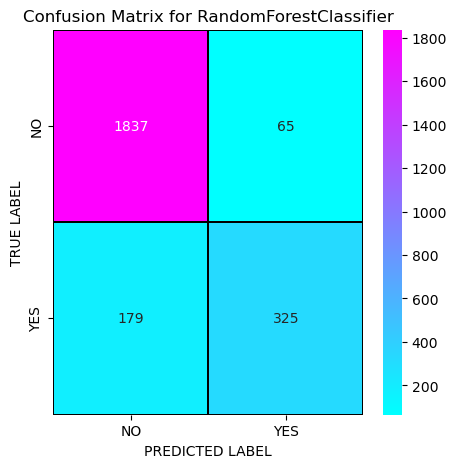

In [58]:
cm = confusion_matrix(y_test,predRFC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="cool",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

# Support Vector Machine Classifier

In [59]:
svc = SVC()
svc.fit(x_train,y_train)

# Prediction
predsvc = svc.predict(x_test)
sv=accuracy_score(y_test, predsvc)
print(sv)
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test,predsvc))

0.8649210307564422
[[1812   90]
 [ 235  269]]
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1902
           1       0.75      0.53      0.62       504

    accuracy                           0.86      2406
   macro avg       0.82      0.74      0.77      2406
weighted avg       0.86      0.86      0.86      2406



**The accuracy score is 86%.**

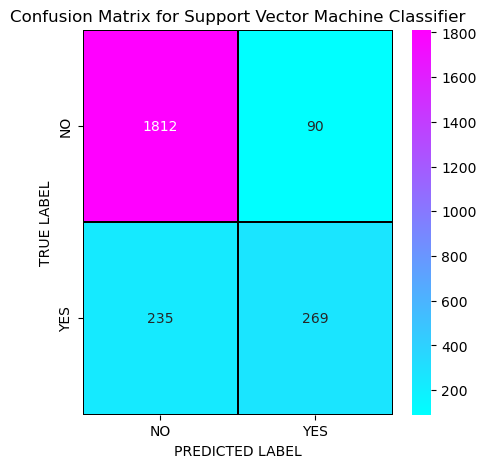

In [61]:
cm = confusion_matrix(y_test,predsvc)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="cool",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

# Gradient Boosting Classifier

In [62]:
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)

# Prediction
predGB = GB.predict(x_test)

gb=accuracy_score(y_test, predGB)
print(gb)
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test,predGB))

0.8649210307564422
[[1809   93]
 [ 232  272]]
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1902
           1       0.75      0.54      0.63       504

    accuracy                           0.86      2406
   macro avg       0.82      0.75      0.77      2406
weighted avg       0.86      0.86      0.86      2406



**The accuracy score is 86.49%**

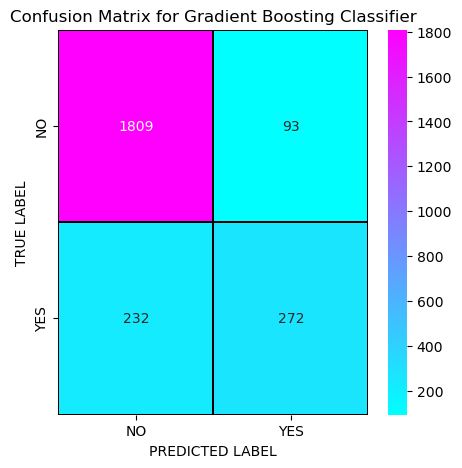

In [63]:
cm = confusion_matrix(y_test,predGB)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="cool",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

# Bagging Classifier

In [64]:
BC = BaggingClassifier()
BC.fit(x_train,y_train)

# Prediction
predBC = BC.predict(x_test)
bc=accuracy_score(y_test, predBC)
print(bc)
print(confusion_matrix(y_test, predBC))
print(classification_report(y_test,predBC))

0.8898586866167914
[[1835   67]
 [ 198  306]]
              precision    recall  f1-score   support

           0       0.90      0.96      0.93      1902
           1       0.82      0.61      0.70       504

    accuracy                           0.89      2406
   macro avg       0.86      0.79      0.82      2406
weighted avg       0.89      0.89      0.88      2406



**The accuracy score is 88.98%**

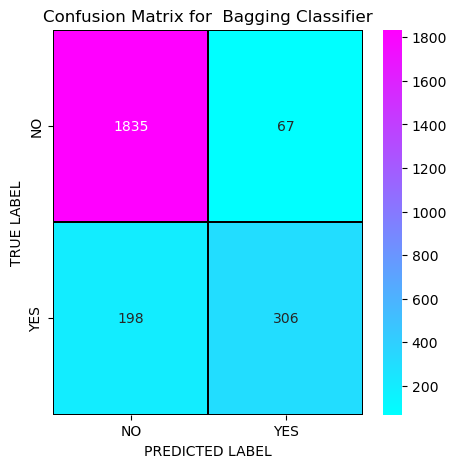

In [65]:
cm = confusion_matrix(y_test,predBC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="cool",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Bagging Classifier')
plt.show()

# Checking Cross Validation Score

In [66]:
# cv score for Random Forest Classifier
rf=cross_val_score(RFC,x,y,cv=5).mean()
print(rf)

0.8535617444224746


In [67]:
# cv score for Support Vector Machine Classifier
sv_cv=cross_val_score(svc,x,y,cv=5).mean()
print(sv_cv)

0.8283640555504563


In [68]:
# cv score for Gradient Boosting Classifier
gb_cv=cross_val_score(GB,x,y,cv=5).mean()
print(gb_cv)

0.8103971201130051


In [69]:
# cv score for Bagging Classifier
bc_cv=cross_val_score(BC,x,y,cv=5).mean()
print(bc_cv)

0.8271168616201232


In [70]:
model_list=['Random Forest Classifier','Support Vector Machine Classifier','Gradient Boosting Classifier','Bagging Classifier','XGB Classifier']

In [71]:
accuracyscore=[rfc,sv,gb,bc]
crossval=[rf,sv_cv,gb_cv,bc_cv]

In [72]:
score_diff=[]
for i in range(len(accuracyscore)):
    score_diff.append(accuracyscore[i]-crossval[i])

RFC = 0.045
SvC= 0.0366
Gradient= 0.0546
Bagging=0.0627

The best model is Support Vector Machine.

# Hyper Parameter Tuning

In [73]:
from sklearn.model_selection import GridSearchCV

In [74]:
params={'C':[1,0.5,1.5],
       'kernel' : ['linear', 'poly', 'rbf'],
        'gamma' : ['scale', 'auto'],
        'random_state':[100,200,150,250]}
GCV=GridSearchCV(SVC(),params,cv=3)

In [75]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [1, 0.5, 1.5], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf'],
                         'random_state': [100, 200, 150, 250]})

In [76]:
GCV.best_params_

{'C': 1.5, 'gamma': 'scale', 'kernel': 'rbf', 'random_state': 100}

In [77]:
FinalModel = SVC(C= 1.5, gamma='scale', kernel= 'rbf', random_state=100)
FinalModel.fit(x_train, y_train)
pred = FinalModel.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

86.53366583541147


So Accuracy of our final Clasification model is 86.53%

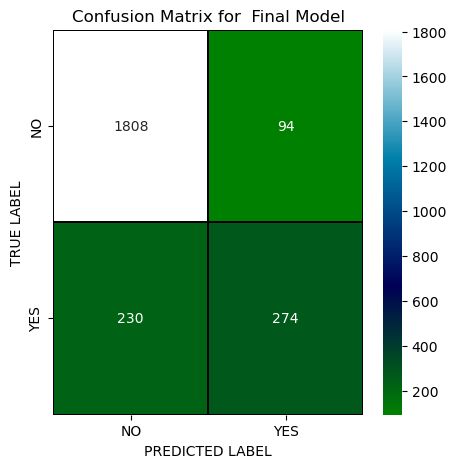

In [78]:
cm = confusion_matrix(y_test,pred)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="ocean",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show()

In [79]:
# Saving the model using .pkl
import joblib
joblib.dump(FinalModel,"RainClassification.pkl")

['RainClassification.pkl']

# Predicting the saved model

In [80]:
model=joblib.load("RainClassification.pkl")
prediction = model.predict(x_test)
prediction

array([0, 0, 0, ..., 0, 0, 0])

In [81]:
a=np.array(y_test)
Class_Result=pd.DataFrame({'Original':a,'Prediction':prediction})
Class_Result

,Original,Prediction
0,0,0
1,0,0
2,0,0
3,1,1
4,0,0
...,...,...
2401,0,0
2402,0,0
2403,0,0
2404,0,0


So we predicted no Rain Tomorrow with our model, and Model Accuracy is 86.53%



# Now let us predict the Rainfall from our data using Regression Model

<Axes: >

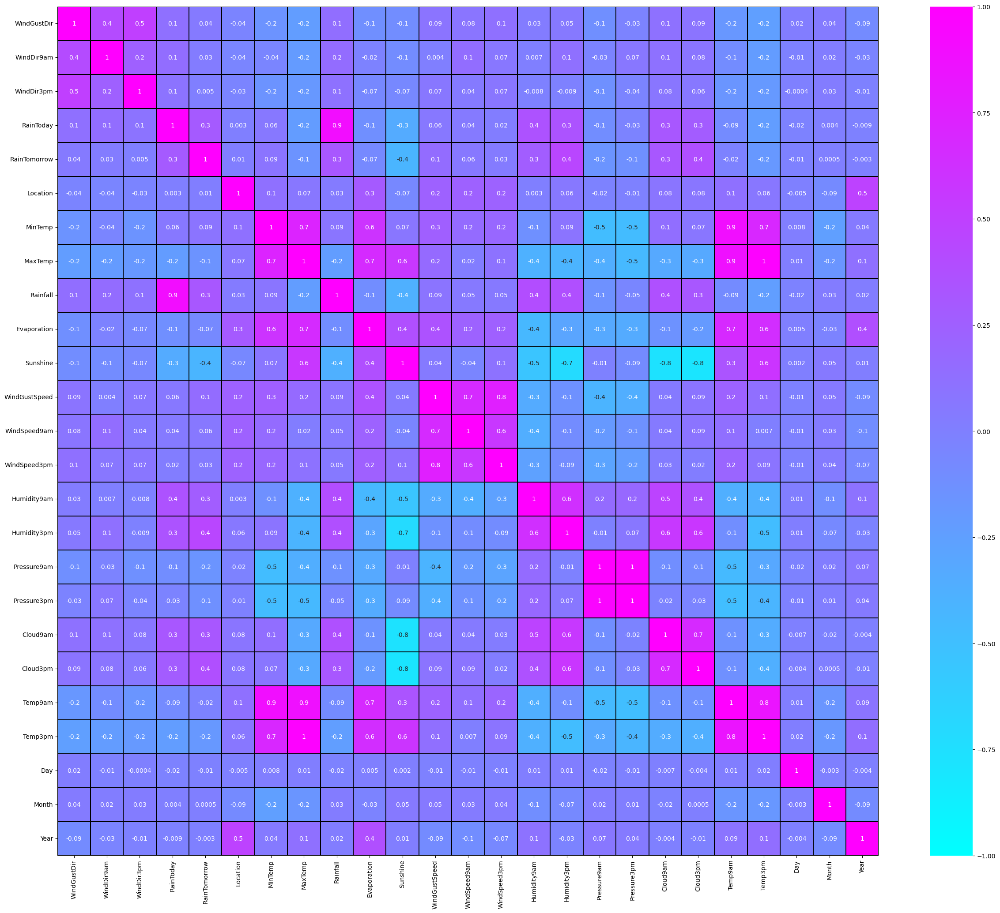

In [82]:
plt.figure(figsize=(30,25))
sns.heatmap(cor,linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="cool")

This gives Corelation with features and Labels, Now letuse check relation with Rainfall

# Visualizing the correlation between label and features using bar plot

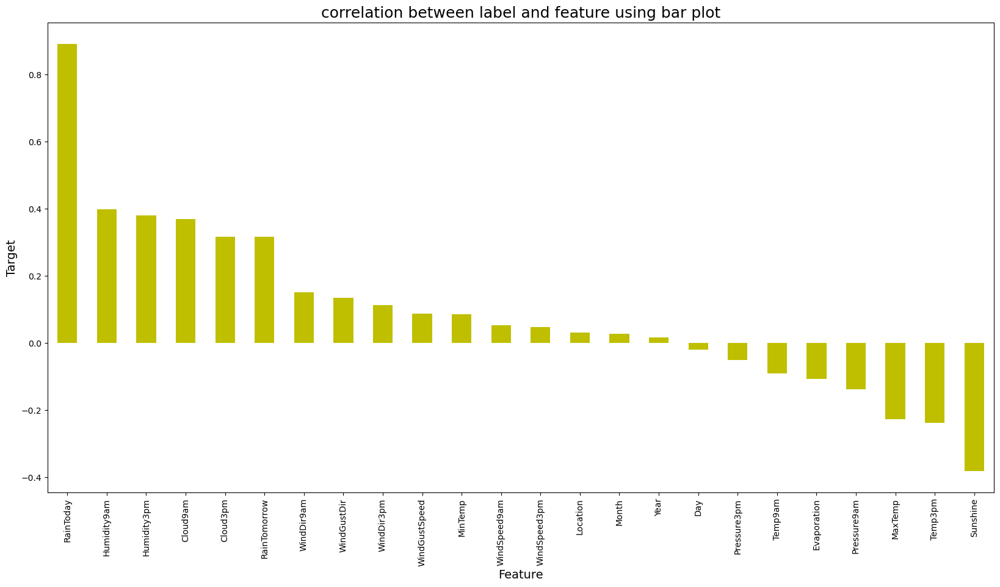

In [83]:
plt.figure(figsize=(20,10))
new_df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='y')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

Almost all features have relation between Label, But only WindSpeed3pm does not have much relation.

# Separating the features and label variables into x and y

In [85]:
x = new_df.drop("Rainfall", axis=1)
y = new_df["Rainfall"]

# Feature Scaling using Standard Scalarization

In [86]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,1.228375,1.251279,1.400759,-0.542317,-0.54328,-1.508676,0.057333,-0.145108,-0.523537,-0.111687,...,-1.617125,-1.693787,-1.405648,1.364812,0.314503,-0.137321,-0.095695,-1.672365,1.632977,-1.662497
1,1.440962,-0.276716,1.626999,-0.542317,-0.54328,-1.508676,-1.054000,0.219999,-0.331041,1.465778,...,-1.451314,-1.219364,-1.289629,-1.237515,-1.084085,-0.083646,0.330524,-1.558700,1.632977,-1.662497
2,1.653549,1.251279,1.626999,-0.542317,-0.54328,-1.508676,-0.035278,0.319574,0.282522,1.303642,...,-1.174962,-1.710146,-1.140461,-0.814846,-0.932367,0.596233,0.142987,-1.445035,1.632977,-1.662497
3,-0.684909,0.378139,-1.766604,-0.542317,-0.54328,-1.508676,-0.720600,0.701276,-0.403928,1.607626,...,-1.948748,-0.074204,-0.460921,-1.461171,-1.321274,0.077378,0.705597,-1.331370,1.632977,-1.662497
4,1.228375,-1.368141,-0.182922,-0.542317,-0.54328,-1.508676,0.816744,1.414894,-0.336656,-0.122011,...,-1.009150,-1.186645,-1.587964,0.987706,1.462762,0.023703,1.251157,-1.217705,1.632977,-1.662497


# Checking Variance Inflation Factor(VIF)

In [87]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.605820,WindGustDir
1,1.374799,WindDir9am
2,1.483173,WindDir3pm
3,1.359622,RainToday
4,1.454632,RainTomorrow
5,1.595325,Location
6,10.153311,MinTemp
7,37.014710,MaxTemp
8,3.700743,Evaporation
9,7.421302,Sunshine


In [88]:
x.drop('Temp3pm',axis=1,inplace=True)

In [89]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.605369,WindGustDir
1,1.373827,WindDir9am
2,1.482608,WindDir3pm
3,1.359541,RainToday
4,1.454368,RainTomorrow
5,1.593611,Location
6,10.060210,MinTemp
7,12.903783,MaxTemp
8,3.700058,Evaporation
9,7.419480,Sunshine


In [90]:
x.drop('Temp9am',axis=1,inplace=True)

In [91]:
vif = pd.DataFrame()#Again check the value of VIF
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.604314,WindGustDir
1,1.373637,WindDir9am
2,1.479805,WindDir3pm
3,1.356517,RainToday
4,1.453996,RainTomorrow
5,1.589549,Location
6,5.897361,MinTemp
7,8.198147,MaxTemp
8,3.684827,Evaporation
9,7.414129,Sunshine


In [92]:
x.drop('Pressure3pm',axis=1,inplace=True)

In [93]:
vif = pd.DataFrame()#Again check the value of VIF
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.596215,WindGustDir
1,1.360713,WindDir9am
2,1.418986,WindDir3pm
3,1.342463,RainToday
4,1.451042,RainTomorrow
5,1.589399,Location
6,5.624573,MinTemp
7,7.139577,MaxTemp
8,3.624877,Evaporation
9,7.209970,Sunshine


Now all features VIF values are below 10, So we can proceed

# Modeling

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    RFG = RandomForestRegressor()
    RFG.fit(x_train, y_train)
    pred = RFG.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)